# Instance Segmentation with Mask Region Based Convolutional Neural Network.

You should have seen in our previous posts that Convolutional Neural Network is the state of the art for any computer vision task like

- [Image classification](https://www.learnopencv.com/pytorch-for-beginners-image-classification-using-pre-trained-models/)

- [Semantic Segmentation](https://www.learnopencv.com/pytorch-for-beginners-semantic-segmentation-using-torchvision/)

- [Object Detection](https://www.learnopencv.com/faster-r-cnn-object-detection-with-pytorch/)

In this notebook we will look at another computer vision application called Instance Segmentation. 

# Instance Segmentation
  Instance Segmentation is a combination of 2 problems
  - Object Detection
  - Semantic Segmentation
  
![](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRmp4t9zSQ9DWyTuWv2OwK4Eq4ydaBbvl1FiaslP_y0etJ89n-5)
  
A kind of network called Mask RCNN is the state of the art in Instance Segmentation. Mask RCNN uses 2 type of networks one like Faster RCNN for Object Detection and another fully convolutional network for Semantic Segmentation. The first model will get the bounding box and classify it and the second model is used on each of the region of interest for semantic segmentation. 
  
![](https://cdn-images-1.medium.com/max/1600/1*IWWOPIYLqqF9i_gXPmBk3g.png)
Image Source: [Mask R-CNN](https://arxiv.org/pdf/1703.06870.pdf)

# Instance Segmentation in PyTorch

If you want to learn more about all of these models and many more application and concepts of Deep Learning and Computer Vision indetail,  check out the official [Deep Learning and Computer Vision courses](https://opencv.org/courses/) by OpenCV.org.

  All the pretrained models in pytorch can be found in [torchvision.models](https://pytorch.org/docs/stable/torchvision/models.html)



The input to the model is expected to be a list of tensors, each of shape [C, H, W], one for each image, and should be in 0-1 range. Different images can have different sizes.


During inference, the model requires only the input tensors, and returns the post-processed predictions as a List[Dict[Tensor]], one for each input image. The fields of the Dict are as follows:

- boxes (Tensor[N, 4]): the predicted boxes in [x0, y0, x1, y1] format, with values between 0 and H and 0 and W

- labels (Tensor[N]): the predicted labels for each image

-  scores (Tensor[N]): the scores or each prediction

-  masks (Tensor[N, H, W]): the predicted masks for each instance, in 0-1 range. In order to obtain the final segmentation masks, the soft masks can be thresholded, generally with a value of 0.5 (mask >= 0.5)

In [6]:
# import necessary libraries
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as T
import torchvision
import torch
import numpy as np
import cv2
import random
import time
import os

In [7]:
# from https://www.analyticsvidhya.com/blog/2023/02/mask-r-cnn-for-instance-segmentation-using-pytorch/
torch.cuda.is_available()

if torch.cuda.is_available():  
  dev = "cuda:0" 
else:  
  dev = "cpu"  
device = torch.device(dev)  

device

device(type='cpu')

In [8]:
 # These are the classes that are available in the COCO-Dataset
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]



## Download the model

In [9]:
# from this blog: https://www.analyticsvidhya.com/blog/2023/02/mask-r-cnn-for-instance-segmentation-using-pytorch/ 
# from torchvision.models.detection import maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights


# weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
# model = maskrcnn_resnet50_fpn(weights=weights, progress=False).to(device)
# model = model.eval()

# Gina re-wrote
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True).to(device)

/Users/gina/miniconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/gina/miniconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [10]:
# get the pretrained model from torchvision.models
# Note: pretrained=True will get the pretrained weights for the model.
# model.eval() to use the model for inference
# model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

Let's create some helper functions.   
We will create the `random_colour_masks()` function to fill the predicted-mask with colors, `get_predictions()` to return the final predictions from the model and finally the `instance_segmentation_api()` to overlay the colored mask over the original image and plot it.

In [11]:

def random_colour_masks(image):
    """
    random_colour_masks
    parameters:
      - image - predicted masks
    method:
      - the masks of each predicted object is given random colour for visualization
    """
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    r[image == 1], g[image == 1], b[image == 1] = colours[random.randrange(0,10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

def get_prediction(img_path, threshold):
    """
    get_prediction
    parameters:
      - img_path - path of the input image
    method:
      - Image is obtained from the image path
      - the image is converted to image tensor using PyTorch's Transforms
      - image is passed through the model to get the predictions
      - masks, classes and bounding boxes are obtained from the model and soft masks are made binary(0 or 1) on masks
        ie: eg. segment of cat is made 1 and rest of the image is made 0

    """
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return masks, pred_boxes, pred_class


def instance_segmentation_api(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):
    """
    instance_segmentation_api
    parameters:
      - img_path - path to input image
    method:
      - prediction is obtained by get_prediction
      - each mask is given random color
      - each mask is added to the image in the ration 1:0.8 with opencv
      - final output is displayed
    """
    masks, boxes, pred_cls = get_prediction(img_path, threshold)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
        rgb_mask = random_colour_masks(masks[i])
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        cv2.rectangle(img, boxes[i][0], boxes[i][1],color=(0, 255, 0), thickness=rect_th)
        cv2.putText(img,pred_cls[i], boxes[i][0], cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [12]:
# We will use the following colors to fill the pixels
colours = [[0, 255, 0],
           [0, 0, 255],
           [255, 0, 0],
           [0, 255, 255],
           [255, 255, 0],
           [255, 0, 255],
           [80, 70, 180],
           [250, 80, 190],
           [245, 145, 50],
           [70, 150, 250],
           [50, 190, 190]]

## Running inference on an image

In [13]:
img = Image.open('./images/mrcnn_baby_teddy.png')
print(img.size)
img = Image.open('./images/mrcnn_bears.png')
print(img.size)
img = Image.open('./gina_oct2018.jpg')
print(img.size)
img = Image.open('./gina_2016.jpg')
print(img.size)
img = Image.open('./MAX_19-23 Surface white background.tif')
print(img.size)

(1137, 765)
(1137, 718)
(4032, 2268)
(1018, 960)
(1000, 690)


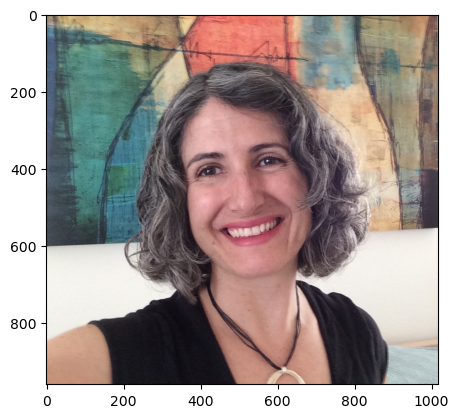

In [14]:
# Download the image and plotting it
#!wget "https://cdn.pixabay.com/photo/2015/09/02/13/24/girl-919048_1280.jpg" -O person.jpg
# Use curl in my machine
# That image is not available anymore

# img = Image.open('./person.jpg')
# img = Image.open('gina_oct2018.jpg')  # larger gives problems
# img = Image.open('./MAX_19-23 Surface white background.tif')  # issue with next cell
# RuntimeError: The size of tensor a (4) must match the size of tensor b (3) at non-singleton dimension 0

img = Image.open('gina_2016.jpg')
plt.imshow(img)
plt.show()

In [15]:
# Running inference on the image
transform = T.Compose([T.ToTensor()])
img_tensor = transform(img)
pred = model([img_tensor])

In [16]:
# Lets look at what the `pred` looks like.
# `pred` is a list of dictionaries, since we had passed a single image, we will get a single-item list
pred[0]

{'boxes': tensor([[   5.5827,  108.8338,  937.3062,  952.0607],
         [ 738.2527,  563.9155, 1012.0494,  873.1965],
         [ 877.4219,  846.0159, 1017.9999,  953.4080],
         [ 884.1560,  850.1586, 1016.0086,  953.1808],
         [   0.0000,  568.5688, 1017.9999,  944.8877],
         [ 741.8759,  557.2582, 1008.3917,  870.8795],
         [   0.0000,  561.0907, 1017.9999,  935.3571],
         [ 881.0537,  848.6201, 1014.8574,  951.0460],
         [   0.0000,  562.0390, 1017.9999,  924.4225],
         [ 713.7120,  558.4721, 1008.9882,  871.0484]],
        grad_fn=<StackBackward0>),
 'labels': tensor([ 1, 63, 67, 65, 65, 65, 63, 63, 15, 62]),
 'scores': tensor([0.9996, 0.4367, 0.3382, 0.2118, 0.1761, 0.1616, 0.1605, 0.0702, 0.0698,
         0.0566], grad_fn=<IndexBackward0>),
 'masks': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]

In [17]:
# We will keep only the pixels with values  greater than 0.5 as 1, and set the rest to 0.
masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
masks.shape

(10, 960, 1018)

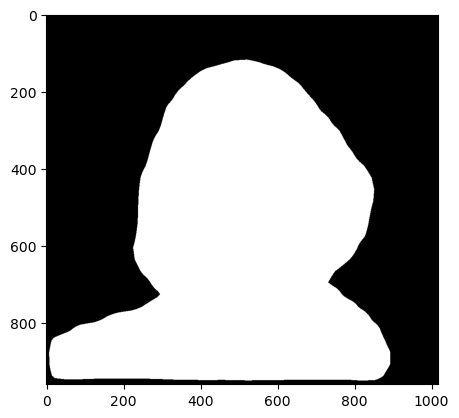

In [18]:
# Using gina_oct2018: TypeError: Invalid shape (4032,) for image data
# Let's plot the mask for the `person` class since the 0th mask belongs to `person`
plt.imshow(masks[0], cmap='gray')
plt.show()

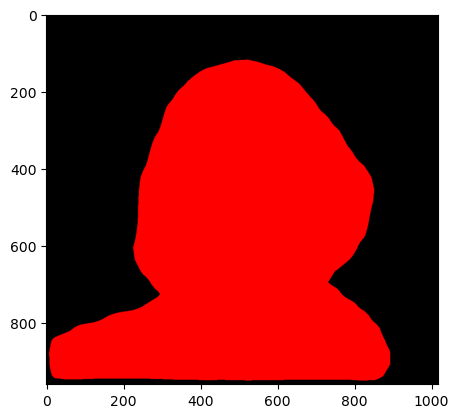

In [19]:
# Let's color the `person` mask using the `random_colour_masks` function
mask1 = random_colour_masks(masks[0])
plt.imshow(mask1)
plt.show()

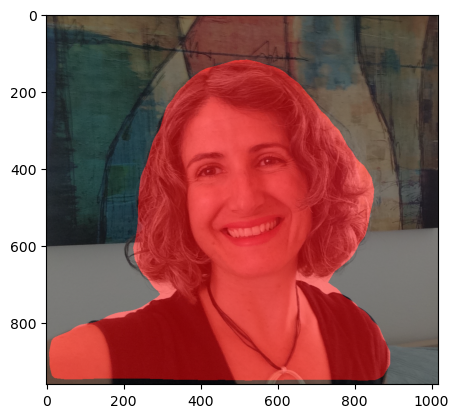

In [20]:
# Let's blend the original and the masked image and plot it.
blend_img = cv2.addWeighted(np.asarray(img), 0.5, mask1, 0.5, 0)

plt.imshow(blend_img)
plt.show()

In [21]:
!wget https://www.wsha.org/wp-content/uploads/banner-diverse-group-of-people-2.jpg -O mrcnn_standing_people.jpg
instance_segmentation_api('./mrcnn_standing_people.jpg', 0.75)

/bin/bash: wget: command not found


FileNotFoundError: [Errno 2] No such file or directory: './mrcnn_standing_people.jpg'

--2021-01-08 07:40:26--  https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.0.155, 151.101.64.155, 151.101.128.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.0.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2178423 (2.1M) [image/jpeg]
Saving to: ‘mrcnn_cars.jpg’


mrcnn_cars.jpg        0%[                    ]       0  --.-KB/s               
mrcnn_cars.jpg      100%[===================>]   2.08M  --.-KB/s    in 0.03s   

2021-01-08 07:40:26 (64.2 MB/s) - ‘mrcnn_cars.jpg’ saved [2178423/2178423]



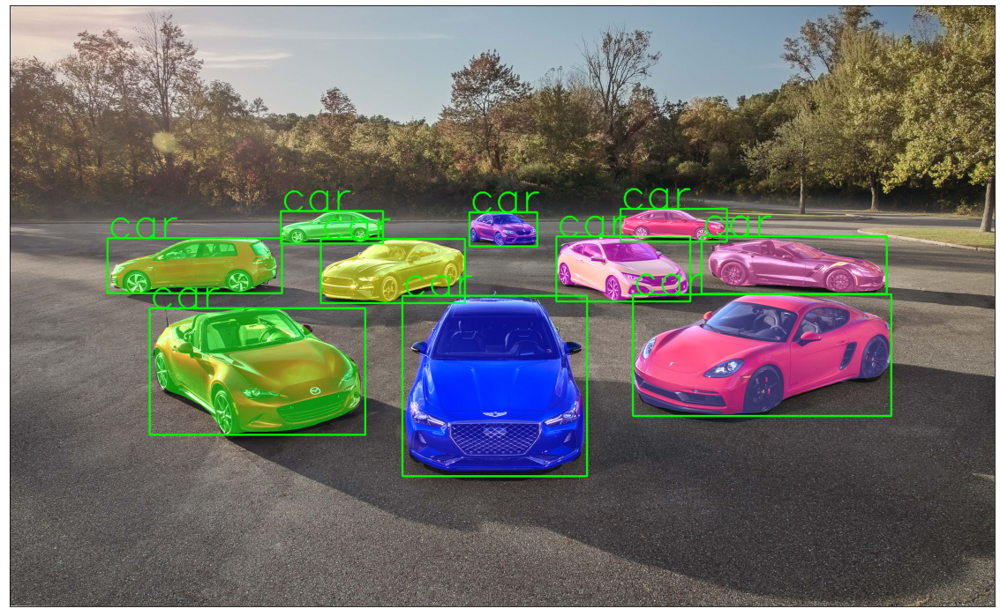

In [ ]:
!wget https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg -O mrcnn_cars.jpg
instance_segmentation_api('./mrcnn_cars.jpg', 0.9, rect_th=5, text_size=5, text_th=5)

--2021-01-08 07:40:37--  https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.21.183, 104.18.20.183, 2606:4700::6812:15b7, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.21.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 253264 (247K) [image/jpeg]
Saving to: ‘mrcnn_traffic.jpg’


mrcnn_traffic.jpg     0%[                    ]       0  --.-KB/s               
mrcnn_traffic.jpg   100%[===================>] 247.33K  --.-KB/s    in 0.005s  

2021-01-08 07:40:37 (48.0 MB/s) - ‘mrcnn_traffic.jpg’ saved [253264/253264]



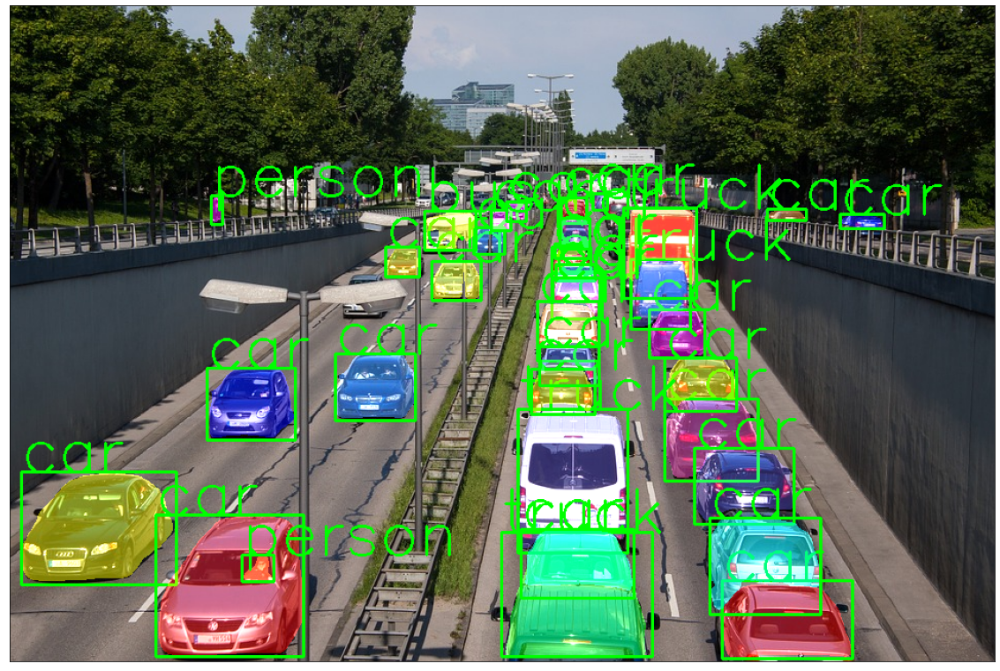

In [ ]:
!wget https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg -O mrcnn_traffic.jpg
instance_segmentation_api('./mrcnn_traffic.jpg', 0.6, rect_th=2, text_size=2, text_th=2)

--2021-01-08 07:40:47--  https://cff2.earth.com/uploads/2019/04/18174234/Why-do-some-animals-eat-their-young--730x410.jpg
Resolving cff2.earth.com (cff2.earth.com)... 13.32.204.27, 13.32.204.76, 13.32.204.34, ...
Connecting to cff2.earth.com (cff2.earth.com)|13.32.204.27|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27647 (27K) [image/jpeg]
Saving to: ‘mrcnn_birds.jpg’


mrcnn_birds.jpg       0%[                    ]       0  --.-KB/s               
mrcnn_birds.jpg     100%[===================>]  27.00K  --.-KB/s    in 0.001s  

2021-01-08 07:40:47 (31.5 MB/s) - ‘mrcnn_birds.jpg’ saved [27647/27647]



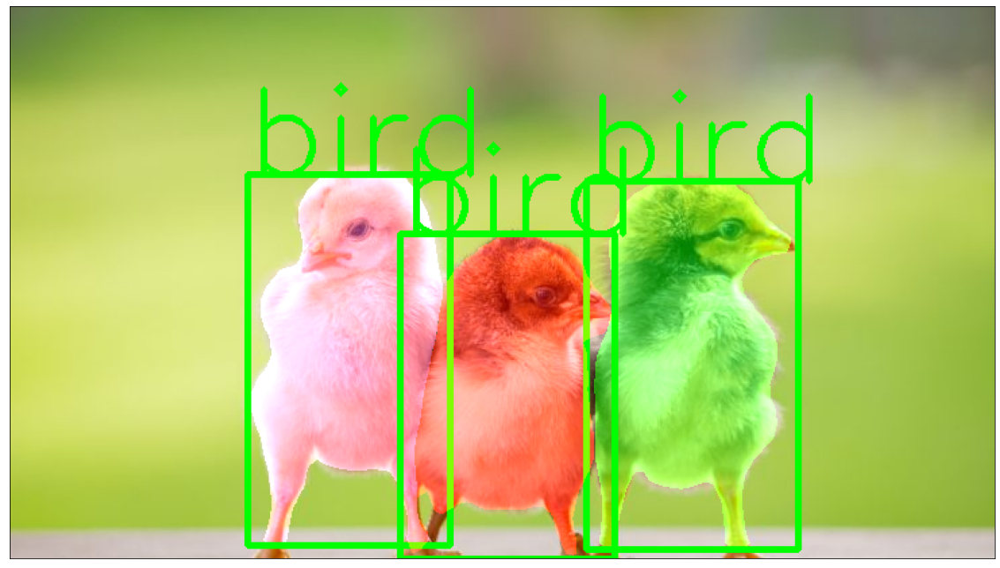

In [ ]:
!wget https://cff2.earth.com/uploads/2019/04/18174234/Why-do-some-animals-eat-their-young--730x410.jpg -O mrcnn_birds.jpg
instance_segmentation_api('./mrcnn_birds.jpg', 0.9)  

--2021-01-08 07:40:55--  http://s1.favim.com/orig/24/boy-pandora-people-street-Favim.com-218622.jpg
Resolving s1.favim.com (s1.favim.com)... 136.243.171.113
Connecting to s1.favim.com (s1.favim.com)|136.243.171.113|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 103318 (101K) [image/jpeg]
Saving to: ‘mrcnn_people.jpg’

mrcnn_people.jpg    100%[===================>] 100.90K   367KB/s    in 0.3s    

2021-01-08 07:40:56 (367 KB/s) - ‘mrcnn_people.jpg’ saved [103318/103318]



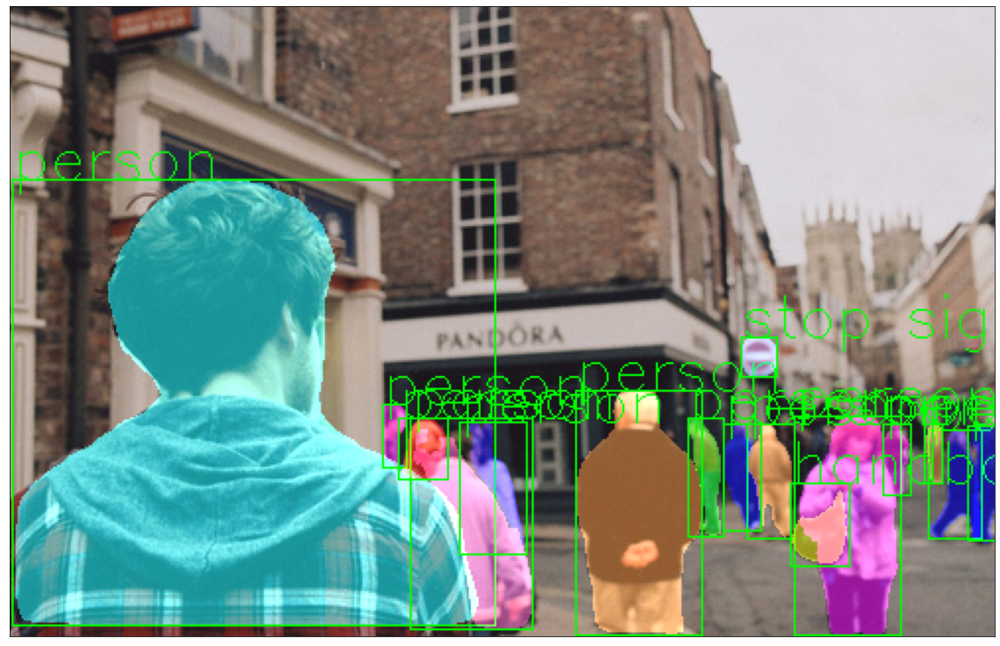

In [ ]:
!wget http://s1.favim.com/orig/24/boy-pandora-people-street-Favim.com-218622.jpg -O mrcnn_people.jpg
instance_segmentation_api('./mrcnn_people.jpg', 0.8, rect_th=1, text_size=1, text_th=1)    

--2021-01-08 07:41:04--  https://images.unsplash.com/photo-1475505035646-a4680971b0fb
Resolving images.unsplash.com (images.unsplash.com)... 199.232.66.208, 2a04:4e42:2f::720
Connecting to images.unsplash.com (images.unsplash.com)|199.232.66.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9711443 (9.3M) [binary/octet-stream]
Saving to: ‘mrcnn_playing.jpg’


mrcnn_playing.jpg     0%[                    ]       0  --.-KB/s               
mrcnn_playing.jpg   100%[===================>]   9.26M  --.-KB/s    in 0.09s   

2021-01-08 07:41:04 (103 MB/s) - ‘mrcnn_playing.jpg’ saved [9711443/9711443]



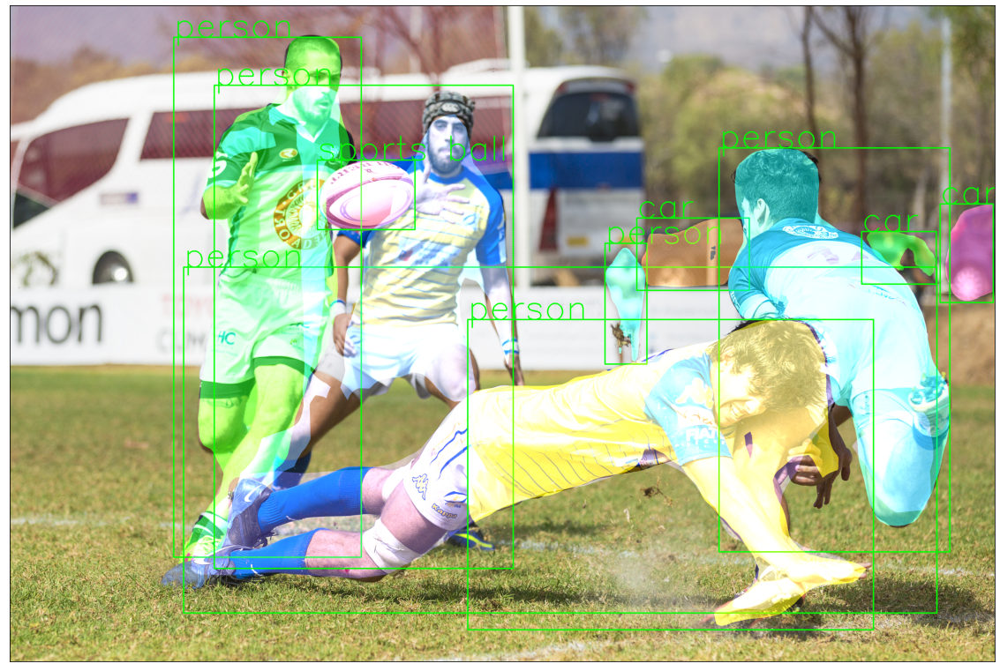

In [ ]:
!wget https://images.unsplash.com/photo-1475505035646-a4680971b0fb -O mrcnn_playing.jpg
instance_segmentation_api('./mrcnn_playing.jpg', 0.8, rect_th=6, text_size=6, text_th=6)    

--2021-01-08 07:41:21--  https://images.unsplash.com/photo-1509205477838-a534e43a849f
Resolving images.unsplash.com (images.unsplash.com)... 151.101.250.208, 2a04:4e42:3b::720
Connecting to images.unsplash.com (images.unsplash.com)|151.101.250.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3778890 (3.6M) [image/jpeg]
Saving to: ‘mrcnn_cat_dog.jpg’


mrcnn_cat_dog.jpg     0%[                    ]       0  --.-KB/s               
mrcnn_cat_dog.jpg   100%[===================>]   3.60M  --.-KB/s    in 0.04s   

2021-01-08 07:41:21 (80.5 MB/s) - ‘mrcnn_cat_dog.jpg’ saved [3778890/3778890]



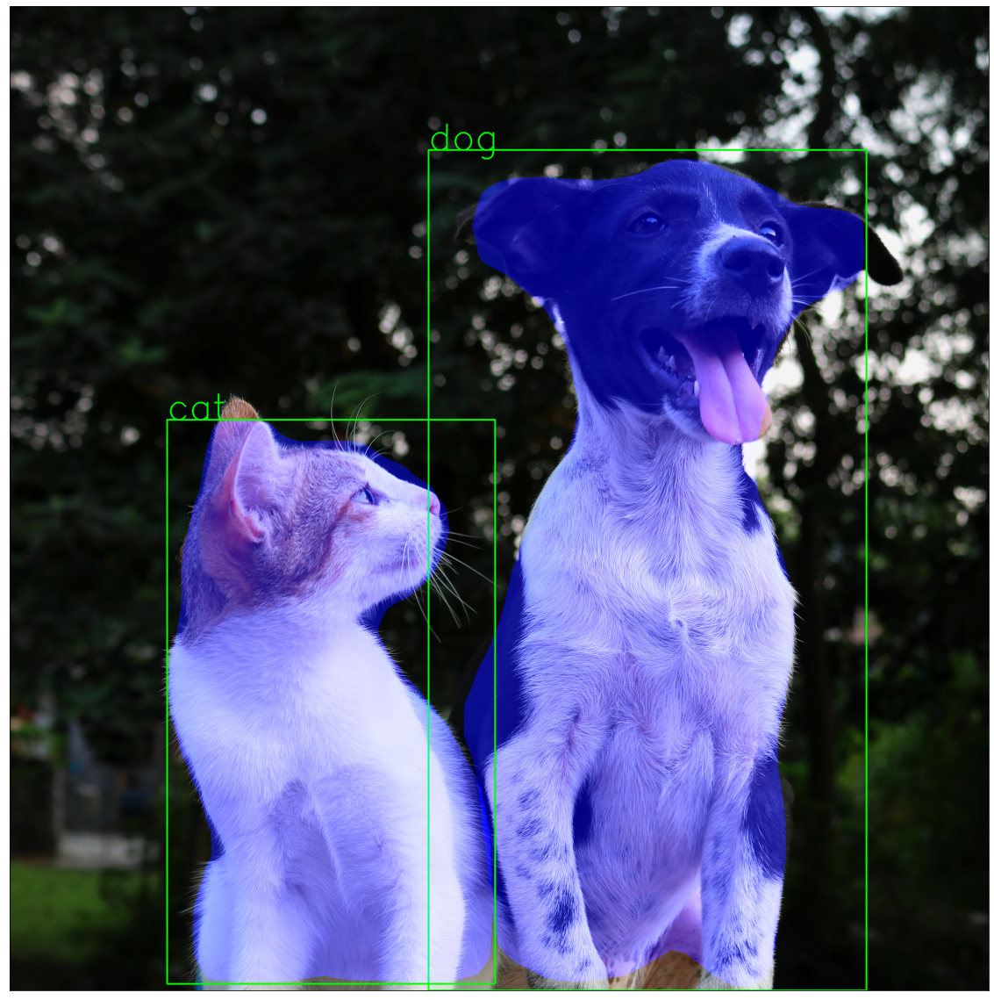

In [ ]:
!wget https://images.unsplash.com/photo-1509205477838-a534e43a849f -O mrcnn_cat_dog.jpg
instance_segmentation_api('./mrcnn_cat_dog.jpg', 0.95, rect_th=5, text_size=5, text_th=5)    

--2021-01-08 07:41:30--  https://cdn-image.travelandleisure.com/sites/default/files/1556203941/katmai-alaska-bears-AKBEAR0419.jpg
Resolving cdn-image.travelandleisure.com (cdn-image.travelandleisure.com)... 13.32.204.24, 13.32.204.52, 13.32.204.80, ...
Connecting to cdn-image.travelandleisure.com (cdn-image.travelandleisure.com)|13.32.204.24|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://imagesvc.meredithcorp.io/v3/mm/image?url=https://static.onecms.io/wp-content/uploads/sites/28/2019/04/katmai-alaska-bears-AKBEAR0419.jpg [following]
--2021-01-08 07:41:30--  https://imagesvc.meredithcorp.io/v3/mm/image?url=https://static.onecms.io/wp-content/uploads/sites/28/2019/04/katmai-alaska-bears-AKBEAR0419.jpg
Resolving imagesvc.meredithcorp.io (imagesvc.meredithcorp.io)... 13.32.181.27, 13.32.181.38, 13.32.181.79, ...
Connecting to imagesvc.meredithcorp.io (imagesvc.meredithcorp.io)|13.32.181.27|:443... connected.
HTTP request sent, awaiting r

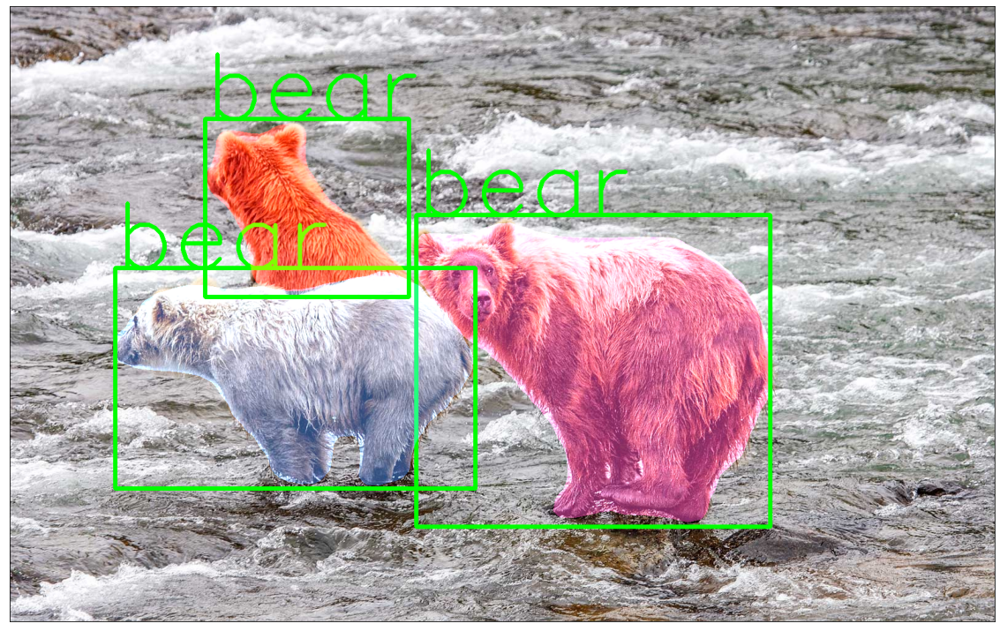

In [ ]:
!wget https://cdn-image.travelandleisure.com/sites/default/files/1556203941/katmai-alaska-bears-AKBEAR0419.jpg -O mrcnn_bear.jpg
instance_segmentation_api('./mrcnn_bear.jpg', 0.9, rect_th=6, text_size=5, text_th=5)    

--2021-01-08 07:41:39--  https://images.unsplash.com/photo-1505148230895-d9a785a555fa
Resolving images.unsplash.com (images.unsplash.com)... 199.232.66.208, 2a04:4e42:2f::720
Connecting to images.unsplash.com (images.unsplash.com)|199.232.66.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3236923 (3.1M) [image/jpeg]
Saving to: ‘mrcnn_elephants.jpg’


mrcnn_elephants.jpg   0%[                    ]       0  --.-KB/s               
mrcnn_elephants.jpg 100%[===================>]   3.09M  --.-KB/s    in 0.03s   

2021-01-08 07:41:39 (96.0 MB/s) - ‘mrcnn_elephants.jpg’ saved [3236923/3236923]



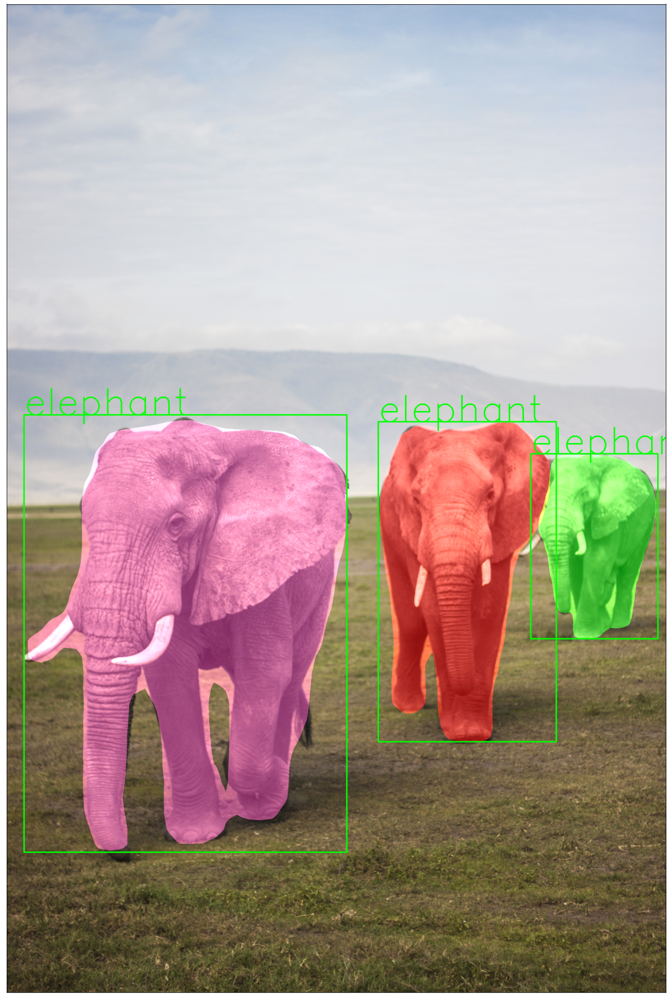

In [ ]:
!wget https://images.unsplash.com/photo-1505148230895-d9a785a555fa -O mrcnn_elephants.jpg
instance_segmentation_api('./mrcnn_elephants.jpg', 0.9, rect_th=6, text_size=6, text_th=6)    

--2021-01-08 07:41:50--  https://images.unsplash.com/photo-1543205764-fee67cf76589
Resolving images.unsplash.com (images.unsplash.com)... 151.101.202.208, 2a04:4e42:50::720
Connecting to images.unsplash.com (images.unsplash.com)|151.101.202.208|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 801495 (783K) [image/jpeg]
Saving to: ‘mrcnn_baby_teddy.jpg’

mrcnn_baby_teddy.jp 100%[===================>] 782.71K  --.-KB/s    in 0.01s   

2021-01-08 07:41:50 (55.3 MB/s) - ‘mrcnn_baby_teddy.jpg’ saved [801495/801495]



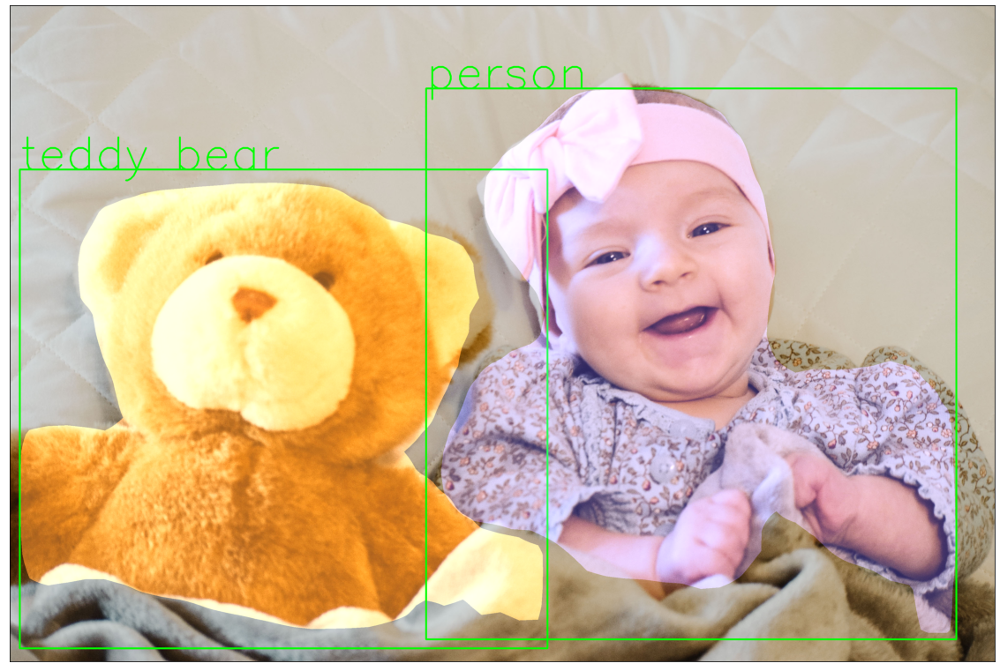

In [ ]:
!wget https://images.unsplash.com/photo-1543205764-fee67cf76589 -O mrcnn_baby_teddy.jpg
instance_segmentation_api('./mrcnn_baby_teddy.jpg', 0.95, rect_th=6, text_size=6, text_th=6)    

# Comparing the inference time of model in CPU & GPU



In [ ]:

def check_inference_time(image_path, gpu=False):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
    model.eval()
    img = Image.open(image_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    if gpu:
        model.cuda()
        img = img.cuda()
    else:
        model.cpu()
        img = img.cpu()
    start_time = time.time()
    pred = model([img])
    end_time = time.time()
    return end_time-start_time

In [ ]:
# Let's run inference on all the downloaded images and average their inference time 
img_paths = [path for path in os.listdir(".") if path.split(".")[-1].lower() in ["jpeg", "jpg", "png"] ]

gpu_time = sum([check_inference_time(img_path, gpu=True) for img_path in img_paths])/len(img_paths)
cpu_time = sum([check_inference_time(img_path, gpu=False) for img_path in img_paths])/len(img_paths)

print('\n\nAverage Time take by the model with GPU = {}s\nAverage Time take by the model with CPU = {}s'.format(gpu_time, cpu_time))



Average Time take by the model with GPU = 0.15243148803710938s
Average Time take by the model with CPU = 7.608787189830434s


# Application: Background blurring

Here we will use the segmentation algorithm to blur the background. The whole concept is broken down into few steps.  
1. Pick the class we want to keep as foreground (person) and get its mask using the segmentation api. The locations belonging to person-class will be labelled as 1 and the rest as 0.
2. Blur the original image.
3. Create a new image such that, pixel locations where the mask is 1 is replaced with the original values and the rest with the blurred values.

Following is the code.

In [ ]:
def pick_person_mask(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3):
    # get the predicted masks and boxes and their corresponding labels
    masks, boxes, pred_cls = get_prediction(img_path, threshold)
    # pick the indices belonging to person
    person_ids = [i for i in range(len(pred_cls)) if pred_cls[i]=="person"]
    # pick the masks with the person-ids
    person_masks = masks[person_ids, :, :]
    # create a single mask out of all the instances and clip them
    persons_mask = person_masks.sum(axis=0)
    persons_mask = np.clip(persons_mask, 0,1)
    return persons_mask 

--2021-01-08 07:45:12--  https://cdn.pixabay.com/photo/2017/02/06/10/54/sad-2042536_1280.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.20.183, 104.18.21.183, 2606:4700::6812:14b7, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.20.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 260652 (255K) [image/jpeg]
Saving to: ‘person_blur.jpg’


person_blur.jpg       0%[                    ]       0  --.-KB/s               
person_blur.jpg     100%[===================>] 254.54K  --.-KB/s    in 0.004s  

2021-01-08 07:45:12 (59.0 MB/s) - ‘person_blur.jpg’ saved [260652/260652]



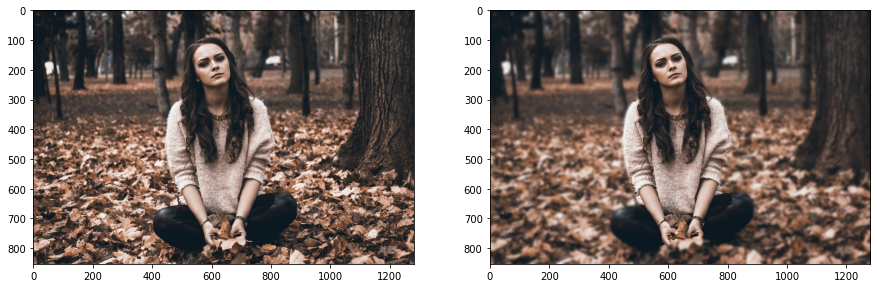

In [ ]:

# These are a few images you can play around with

# https://cdn.pixabay.com/photo/2016/02/19/10/06/woman-1209072_1280.jpg
# https://cdn.pixabay.com/photo/2018/03/12/20/57/woman-3220835_1280.jpg
# https://cdn.pixabay.com/photo/2017/02/06/10/54/sad-2042536_1280.jpg
# https://cdn.pixabay.com/photo/2016/11/29/09/49/blond-1868815_1280.jpg
# https://cdn.pixabay.com/photo/2017/03/27/14/56/auto-2179220_1280.jpg
# https://cdn.pixabay.com/photo/2017/03/27/14/56/auto-2179220_1280.jpg

!wget https://cdn.pixabay.com/photo/2017/02/06/10/54/sad-2042536_1280.jpg -O person_blur.jpg

# grab the image and blur it
img_path = "person_blur.jpg"
img = cv2.imread(img_path)
img_blur = cv2.GaussianBlur(img, (21, 21), 0)

# create the person-mask
person_mask = pick_person_mask(img_path, threshold=0.5, rect_th=3, text_size=3, text_th=3).astype(np.uint8)
person_mask = np.repeat(person_mask[:, :, None], 3, axis=2)

# finally, create a new image such that pixels where the mask=1, replace it with original image and keep the rest of the pixels
# with blurred image
final_img = np.where(person_mask==1, img, img_blur)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img[:,:,::-1])
plt.subplot(122)
plt.imshow(final_img[:,:,::-1])
plt.show()